# Import Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
!pip install missingno
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Load Data

In [2]:
# load the csv file

df1 = pd.read_csv("swiggy.csv")

df1.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


In [3]:
df = df1.copy()

In [4]:
df.shape

(45593, 20)

In [5]:
df.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


In [6]:
# shape of data

rows, cols = df.shape

print("The dataset has {} rows and {} columns".format(rows,cols))
print("The dataset has {} rows and {} columns".format(rows , cols))

The dataset has 45593 rows and 20 columns
The dataset has 45593 rows and 20 columns


In [7]:
# datatypes of columns                

"""
df.dtypes returns a Series with column names as the index and their corresponding data types (dtype) as values.

. rename("Data Types") renames the name of the Series from None to "Data Types".

"""

df.dtypes.rename("Data Types")



ID                              object
Delivery_person_ID              object
Delivery_person_Age             object
Delivery_person_Ratings         object
Restaurant_latitude            float64
Restaurant_longitude           float64
Delivery_location_latitude     float64
Delivery_location_longitude    float64
Order_Date                      object
Time_Orderd                     object
Time_Order_picked               object
Weatherconditions               object
Road_traffic_density            object
Vehicle_condition                int64
Type_of_order                   object
Type_of_vehicle                 object
multiple_deliveries             object
Festival                        object
City                            object
Time_taken(min)                 object
Name: Data Types, dtype: object

In [8]:
# info about the data

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45593 non-null  object 
 1   Delivery_person_ID           45593 non-null  object 
 2   Delivery_person_Age          45593 non-null  object 
 3   Delivery_person_Ratings      45593 non-null  object 
 4   Restaurant_latitude          45593 non-null  float64
 5   Restaurant_longitude         45593 non-null  float64
 6   Delivery_location_latitude   45593 non-null  float64
 7   Delivery_location_longitude  45593 non-null  float64
 8   Order_Date                   45593 non-null  object 
 9   Time_Orderd                  45593 non-null  object 
 10  Time_Order_picked            45593 non-null  object 
 11  Weatherconditions            45593 non-null  object 
 12  Road_traffic_density         45593 non-null  object 
 13  Vehicle_conditio

**Corrections**:

1. Age column should be numerical.
2. Ratings should be float.
3. Date and time columns should be date and time.
4. Vehicle conditions seems to be categorical column which is integer encoded.
5. Multiple deliveries should be integer column.
6. Target column should also be numbers.

In [9]:
# missing values in data

df.isna().sum()


ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Order_Date                     0
Time_Orderd                    0
Time_Order_picked              0
Weatherconditions              0
Road_traffic_density           0
Vehicle_condition              0
Type_of_order                  0
Type_of_vehicle                0
multiple_deliveries            0
Festival                       0
City                           0
Time_taken(min)                0
dtype: int64

In [10]:
df.isna().sum().sum()

0

**There are no missing values in the data**

In [11]:
# sample 50 rows of data for viewing

df.sample(150)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
43801,0x24b6,MUMRES03DEL03,37,4.7,19.223840,72.841347,19.313840,72.931347,02-03-2022,17:15:00,17:30:00,conditions Windy,Medium,1,Snack,motorcycle,1,No,NaN,(min) 24
8854,0x4ea4,SURRES010DEL02,21,4.7,21.171060,72.789292,21.251060,72.869292,04-03-2022,19:35:00,19:40:00,conditions Fog,Jam,1,Drinks,scooter,1,No,Metropolitian,(min) 38
37941,0xc7ae,KOCRES13DEL02,26,4.6,9.991703,76.293136,10.071703,76.373136,12-02-2022,18:15:00,18:20:00,conditions Cloudy,Medium,0,Drinks,motorcycle,1,No,NaN,(min) 39
40228,0x8a33,SURRES17DEL01,21,4.9,21.149569,72.772697,21.189569,72.812697,15-03-2022,14:55:00,15:05:00,conditions Stormy,High,1,Snack,motorcycle,1,No,Metropolitian,(min) 24
17254,0xb96b,BANGRES11DEL01,39,4.8,12.934365,77.616155,12.944365,77.626155,19-03-2022,09:10:00,09:15:00,conditions Sunny,Low,0,Meal,motorcycle,1,No,Urban,(min) 24
33904,0xcc7b,BHPRES13DEL01,20,4.5,23.230791,77.437020,23.240791,77.447020,17-02-2022,08:10:00,08:15:00,conditions Sandstorms,Low,0,Meal,motorcycle,1,No,Metropolitian,(min) 21
38455,0x2bc9,RANCHIRES08DEL03,35,4.6,23.353783,85.326967,23.383783,85.356967,09-03-2022,23:25:00,23:35:00,conditions Cloudy,Low,1,Snack,scooter,0,No,Urban,(min) 15
2803,0x43e3,INDORES16DEL02,39,4.4,22.744648,75.894377,22.824648,75.974377,02-03-2022,17:50:00,18:00:00,conditions Fog,Medium,1,Snack,motorcycle,1,No,Metropolitian,(min) 41
14868,0x1564,JAPRES17DEL01,32,4.6,26.892312,75.806896,26.932312,75.846896,30-03-2022,16:10:00,16:20:00,conditions Fog,Medium,0,Snack,motorcycle,1,No,Urban,(min) 25
33991,0x2f0c,MYSRES01DEL03,22,4.5,12.311072,76.654878,12.371072,76.714878,07-03-2022,22:00:00,22:05:00,conditions Sunny,Jam,1,Snack,motorcycle,0,No,Metropolitian,(min) 14


**NaN values in the data**

Investigate further

# Missing values

Missing values are string type in the data with an extra space.

In [12]:
df.loc[43317,"Delivery_person_Ratings"]

'NaN '

In [13]:
# String NaNs in the data

(df == "NaN ").sum().sum()

8515

8515 such NaN's in the data

In [14]:
# column wise string NaNs

(df == "NaN ").sum()

ID                                0
Delivery_person_ID                0
Delivery_person_Age            1854
Delivery_person_Ratings        1908
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    1731
Time_Order_picked                 0
Weatherconditions                 0
Road_traffic_density            601
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries             993
Festival                        228
City                           1200
Time_taken(min)                   0
dtype: int64

In [15]:
# replace string NaN with NaN

df = df.replace("NaN ",np.NaN)


In [16]:
df.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


In [17]:
# verify missing values in the data

df.isnull().sum()

ID                                0
Delivery_person_ID                0
Delivery_person_Age            1854
Delivery_person_Ratings        1908
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    1731
Time_Order_picked                 0
Weatherconditions                 0
Road_traffic_density            601
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries             993
Festival                        228
City                           1200
Time_taken(min)                   0
dtype: int64

**Verified that string NaNs converted to Nan**

In [18]:
# NaN in the weather column

df["Weatherconditions"] = df["Weatherconditions"].str.replace("conditions ","").replace("NaN",np.NaN)


In [19]:
df["Weatherconditions"].isnull().sum()


616

In [20]:
df.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


**616 missing values in the weather column**

In [21]:
# df with all the missing values replace

missing_df = (
df.replace("NaN ",np.NaN).assign(Weatherconditions = lambda df_ : (df_['Weatherconditions'].str.replace("conditions ","")
                                                                   .replace("NaN",np.NaN)))
)

missing_df.head(150)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30
5,0x9bb4,HYDRES09DEL03,22,4.8,17.431668,78.408321,17.461668,78.438321,11-03-2022,21:20:00,21:30:00,Cloudy,Jam,0,Buffet,motorcycle,1,No,Urban,(min) 26
6,0x95b4,RANCHIRES15DEL01,33,4.7,23.369746,85.339820,23.479746,85.449820,04-03-2022,19:15:00,19:30:00,Fog,Jam,1,Meal,scooter,1,No,Metropolitian,(min) 40
7,0x9eb2,MYSRES15DEL02,35,4.6,12.352058,76.606650,12.482058,76.736650,14-03-2022,17:25:00,17:30:00,Cloudy,Medium,2,Meal,motorcycle,1,No,Metropolitian,(min) 32
8,0x1102,HYDRES05DEL02,22,4.8,17.433809,78.386744,17.563809,78.516744,20-03-2022,20:55:00,21:05:00,Stormy,Jam,0,Buffet,motorcycle,1,No,Metropolitian,(min) 34
9,0xcdcd,DEHRES17DEL01,36,4.2,30.327968,78.046106,30.397968,78.116106,12-02-2022,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3,No,Metropolitian,(min) 46


In [22]:
# missing values in data

missing_df.isna().sum()

ID                                0
Delivery_person_ID                0
Delivery_person_Age            1854
Delivery_person_Ratings        1908
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    1731
Time_Order_picked                 0
Weatherconditions               616
Road_traffic_density            601
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries             993
Festival                        228
City                           1200
Time_taken(min)                   0
dtype: int64

In [23]:
missing_df.shape

(45593, 20)

In [24]:
# total missing values in data

missing_df.isna().sum().sum()

9131

In [25]:
8515 + 616

9131

## Missing Value Analysis

### Matrix

<Axes: >

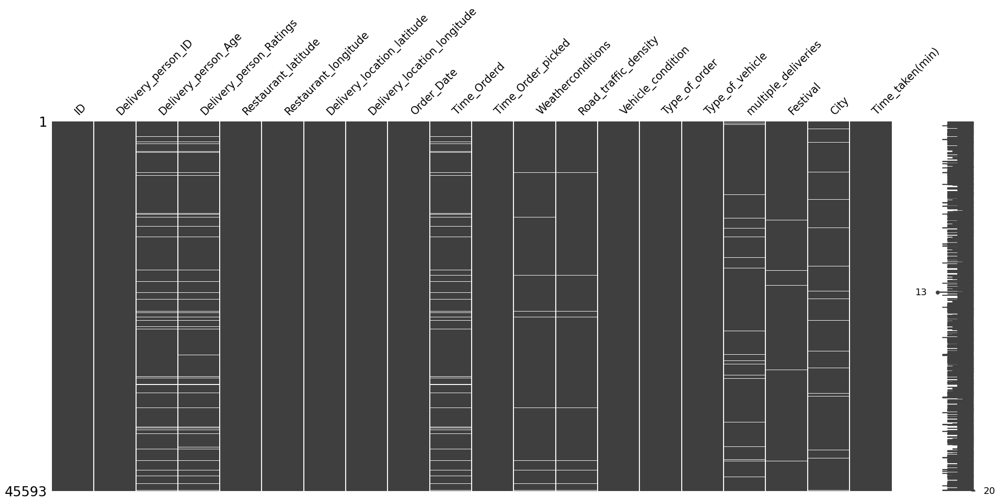

In [26]:
# missing values matrix
import missingno as msno

msno.matrix(df)

### Count of Missing Values

<Axes: >

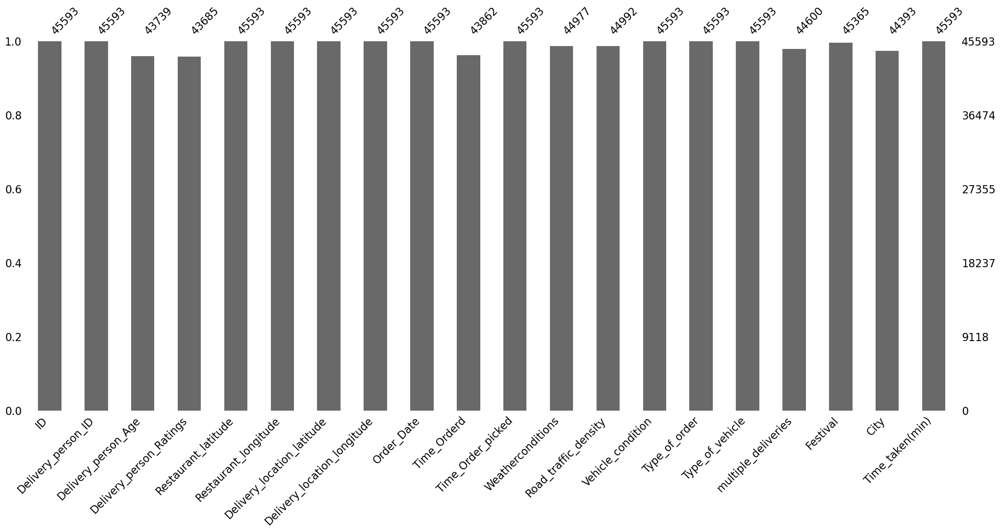

In [27]:
# bar plot for columns having missing data

msno.bar(df)

### Missing Corr

<Axes: >

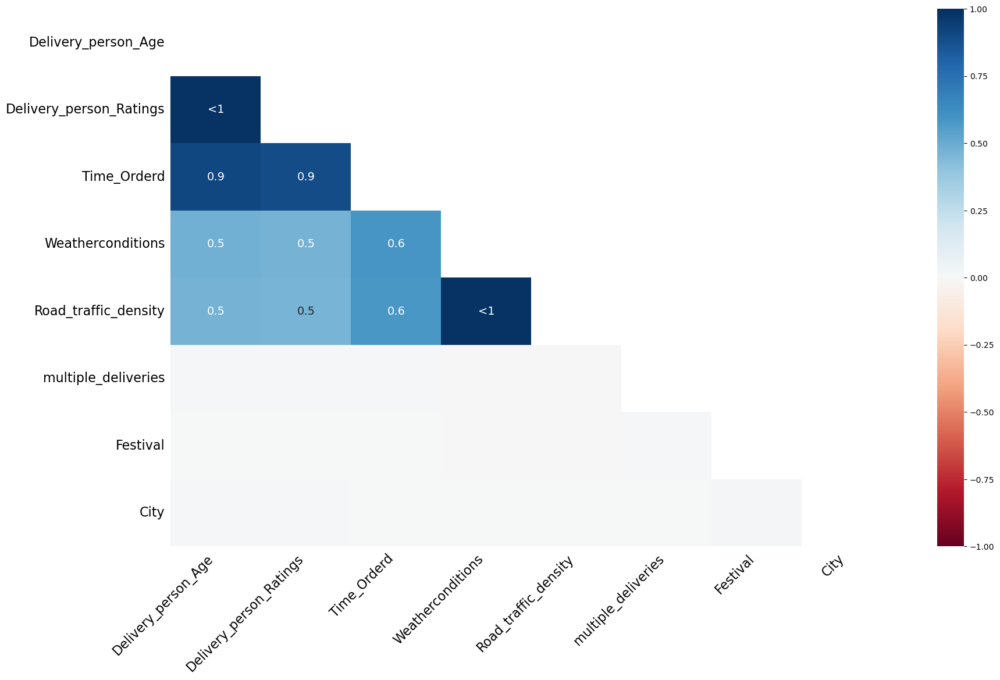

In [28]:
# missing data correlation

msno.heatmap(df)

**Observations**

1. The delivery person columns are correlated to each other. This means that missingness in these columns is highly related which means lack of rider data.
2. The time ordered column is also related to the rider which shows that the data might be missing due to some network error where the system was unable to log rider details and time of order.
3. There is a very high correlation between weather patterns and the road traffic information. Be clear that this does not mean that the road traffic and weather columns are correlated. High corr in missingness means that if value in one column is missing, it is a high chance that it will be missing in others as well.
3. Road traffic density also shows correlation to the rider as it might be provided through the phone of rider (need to investigate).


In [29]:
df[["Weatherconditions","Road_traffic_density"]].isna().sum()

Weatherconditions       616
Road_traffic_density    601
dtype: int64

In [30]:
# prove point of missingness

df_cols = missing_df[["Weatherconditions", "Road_traffic_density"]]

both_missing = df_cols.isna().all(axis=1).sum()
total_missing = df_cols.isna().sum().sum()

result = both_missing / total_missing
print(f"Proportion of jointly missing rows: {result:.2%}")
print("Proportion of jointly missing rows: {:.2f}%".format(result * 100))


Proportion of jointly missing rows: 49.38%
Proportion of jointly missing rows: 49.38%


### Dendrogram

<Axes: >

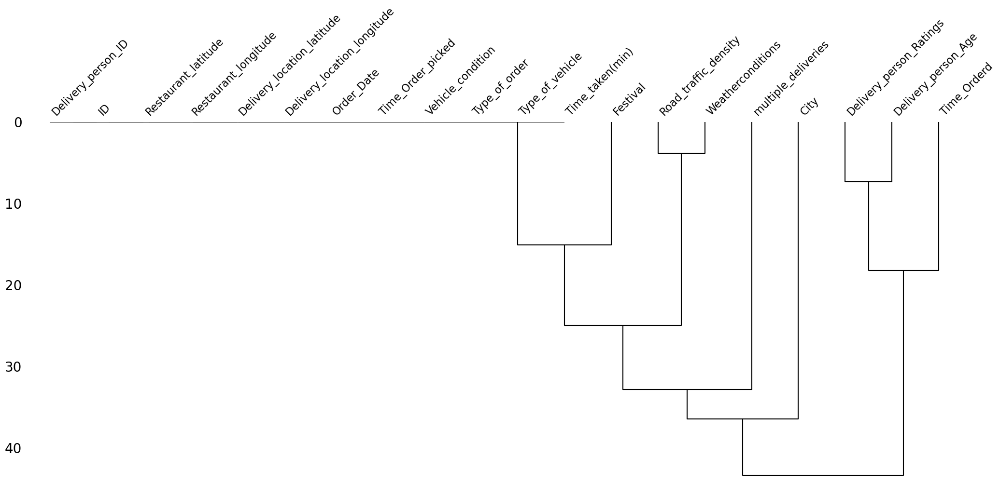

In [31]:
# dendrogram of missingness

msno.dendrogram(df)

In [32]:
# percentage of rows in the data having missing value

(df.isna().any(axis=1).sum() / df.shape[0]) * 100

9.266773408198627

9.27% of the rows in the dataset have at least one missing value.

In [33]:
df.isna().any(axis=1).sum()

4225

In [34]:
df.shape[0]

45593

In [35]:
df.shape

(45593, 20)

**About `9%` of the rows in the data have missing values**

# Basic Data Cleaning

In [36]:
# column names in data

df.columns.tolist()

['ID',
 'Delivery_person_ID',
 'Delivery_person_Age',
 'Delivery_person_Ratings',
 'Restaurant_latitude',
 'Restaurant_longitude',
 'Delivery_location_latitude',
 'Delivery_location_longitude',
 'Order_Date',
 'Time_Orderd',
 'Time_Order_picked',
 'Weatherconditions',
 'Road_traffic_density',
 'Vehicle_condition',
 'Type_of_order',
 'Type_of_vehicle',
 'multiple_deliveries',
 'Festival',
 'City',
 'Time_taken(min)']

In [37]:

df.rename(str.lower,axis=1).head(100)

,id,delivery_person_id,delivery_person_age,delivery_person_ratings,restaurant_latitude,restaurant_longitude,delivery_location_latitude,delivery_location_longitude,order_date,time_orderd,time_order_picked,weatherconditions,road_traffic_density,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city,time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30
5,0x9bb4,HYDRES09DEL03,22,4.8,17.431668,78.408321,17.461668,78.438321,11-03-2022,21:20:00,21:30:00,Cloudy,Jam,0,Buffet,motorcycle,1,No,Urban,(min) 26
6,0x95b4,RANCHIRES15DEL01,33,4.7,23.369746,85.339820,23.479746,85.449820,04-03-2022,19:15:00,19:30:00,Fog,Jam,1,Meal,scooter,1,No,Metropolitian,(min) 40
7,0x9eb2,MYSRES15DEL02,35,4.6,12.352058,76.606650,12.482058,76.736650,14-03-2022,17:25:00,17:30:00,Cloudy,Medium,2,Meal,motorcycle,1,No,Metropolitian,(min) 32
8,0x1102,HYDRES05DEL02,22,4.8,17.433809,78.386744,17.563809,78.516744,20-03-2022,20:55:00,21:05:00,Stormy,Jam,0,Buffet,motorcycle,1,No,Metropolitian,(min) 34
9,0xcdcd,DEHRES17DEL01,36,4.2,30.327968,78.046106,30.397968,78.116106,12-02-2022,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3,No,Metropolitian,(min) 46


In [38]:
def change_column_names(data):
    return (
        data.rename(str.lower,axis=1)
        .rename({
            "delivery_person_id" : "rider_id",
            "delivery_person_age": "age",
            "delivery_person_ratings": "ratings",
            "delivery_location_latitude": "delivery_latitude",
            "delivery_location_longitude": "delivery_longitude",
            "time_orderd": "order_time",
            "time_order_picked": "order_picked_time",
            "weatherconditions": "weather",
            "road_traffic_density": "traffic",
            "city": "city_type",
            "time_taken(min)": "time_taken"},axis=1)
    )

In [39]:
# change column names

df = change_column_names(df)

In [40]:
df.head()

,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


In [41]:
df.duplicated().sum()

0

In [42]:
# check for duplicate rows

df.drop(columns=["id","rider_id"]).duplicated().sum()

0

In [43]:
df.shape

(45593, 20)

**There are no duplicate rows in the data**

## Column Wise Cleaning

### ID

In [44]:
# unique items in ID column

print(f"The number of unique IDs are {df['id'].nunique()}")

The number of unique IDs are 45593


In [45]:
df['id'].dtype

dtype('O')

**All the ID values are unique**

This column can be dropped from the data

### Rider Id

In [46]:
df['rider_id'].dtype

dtype('O')

In [47]:
# unique rider ids in the column

df['rider_id'].nunique()

1320

**The data contains 1320 unique riders**

In [48]:
# rider order count in data

df['rider_id'].value_counts()

PUNERES01DEL01        67
JAPRES11DEL02         67
HYDRES04DEL02         66
JAPRES03DEL01         66
VADRES11DEL02         66
RANCHIRES02DEL01      66
VADRES08DEL02         66
INDORES15DEL01        65
RANCHIRES02DEL02      65
BANGRES07DEL02        65
INDORES08DEL02        65
JAPRES09DEL02         65
VADRES11DEL01         65
SURRES11DEL01         65
BANGRES03DEL01        65
VADRES14DEL01         65
VADRES12DEL02         64
MUMRES02DEL02         64
HYDRES12DEL02         64
MUMRES14DEL02         64
RANCHIRES16DEL01      64
COIMBRES010DEL02      64
HYDRES08DEL02         63
BANGRES16DEL02        63
MYSRES04DEL02         63
CHENRES16DEL02        63
PUNERES17DEL01        63
SURRES01DEL02         63
JAPRES14DEL02         63
COIMBRES02DEL01       63
SURRES010DEL02        63
MYSRES05DEL01         63
HYDRES02DEL01         63
MYSRES05DEL02         63
HYDRES11DEL02         63
MYSRES14DEL01         63
RANCHIRES14DEL02      63
JAPRES20DEL02         63
BANGRES09DEL01        63
SURRES13DEL02         63


In [49]:
df['rider_id'].str.split("RES")

0           [INDO, 13DEL02 ]
1           [BANG, 18DEL02 ]
2           [BANG, 19DEL01 ]
3          [COIMB, 13DEL02 ]
4           [CHEN, 12DEL01 ]
5            [HYD, 09DEL03 ]
6         [RANCHI, 15DEL01 ]
7            [MYS, 15DEL02 ]
8            [HYD, 05DEL02 ]
9            [DEH, 17DEL01 ]
10           [KOC, 16DEL01 ]
11          [PUNE, 13DEL03 ]
12          [LUDH, 15DEL02 ]
13           [KNP, 14DEL02 ]
14           [MUM, 15DEL03 ]
15           [MYS, 01DEL01 ]
16          [PUNE, 20DEL01 ]
17           [HYD, 14DEL01 ]
18           [KOL, 15DEL03 ]
19          [PUNE, 19DEL02 ]
20        [RANCHI, 06DEL02 ]
21         [COIMB, 13DEL01 ]
22          [CHEN, 19DEL02 ]
23           [MUM, 02DEL01 ]
24          [CHEN, 01DEL01 ]
25           [JAP, 16DEL03 ]
26           [SUR, 15DEL03 ]
27          [BANG, 09DEL03 ]
28          [PUNE, 04DEL01 ]
29         [COIMB, 02DEL03 ]
30           [SUR, 16DEL02 ]
31           [GOA, 15DEL02 ]
32           [GOA, 07DEL01 ]
33        [RANCHI, 02DEL01 ]
34          [P

In [50]:
# extract city name out of rider id

(df['rider_id'].str.split("RES").str.get(0).rename("City_Name"))

0          INDO
1          BANG
2          BANG
3         COIMB
4          CHEN
5           HYD
6        RANCHI
7           MYS
8           HYD
9           DEH
10          KOC
11         PUNE
12         LUDH
13          KNP
14          MUM
15          MYS
16         PUNE
17          HYD
18          KOL
19         PUNE
20       RANCHI
21        COIMB
22         CHEN
23          MUM
24         CHEN
25          JAP
26          SUR
27         BANG
28         PUNE
29        COIMB
30          SUR
31          GOA
32          GOA
33       RANCHI
34         PUNE
35         PUNE
36         PUNE
37          SUR
38          HYD
39         BANG
40         BANG
41         CHEN
42          MUM
43          SUR
44          MUM
45          KOL
46          MUM
47         BANG
48         CHEN
49          SUR
50       RANCHI
51         BANG
52         AURG
53        COIMB
54          SUR
55        COIMB
56          AGR
57          VAD
58          JAP
59          VAD
60          JAP
61          MYS
62      

In [51]:
df.shape

(45593, 20)

### Age

In [52]:
# datatype

df['age'].dtype

dtype('O')

In [53]:
df['age'] = df['age'].astype(float)

In [54]:
# min, mean and max values

df['age'].describe()

count    43739.000000
mean        29.567137
std          5.815155
min         15.000000
25%         25.000000
50%         30.000000
75%         35.000000
max         50.000000
Name: age, dtype: float64

In [55]:
df['age'].dtype

dtype('float64')

In [56]:
df['age'].isnull().sum()

1854

**Minimum Rider age of 15 is concerning**

Investigate further what type of transport is he using?

<Axes: >

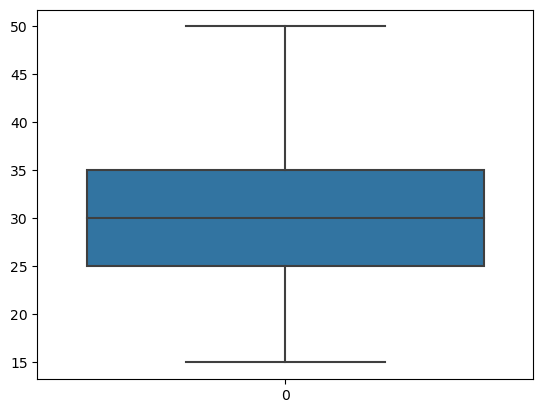

In [57]:
# boxplot of the age column

sns.boxplot(df['age'])

In [58]:
# rows of data where rider age is less than 18(minor)


minors_data = df[df['age'] < 18]

minors_data

,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken
2387,0x564,JAPRES15DEL03,15.0,1,-26.891191,75.802083,26.981191,75.892083,12-03-2022,NaN,17:20:00,NaN,NaN,3,Meal,motorcycle,0,No,Urban,(min) 15
2905,0xcd0,INDORES010DEL03,15.0,1,22.750040,75.902847,22.810040,75.962847,03-04-2022,NaN,20:30:00,NaN,NaN,3,Snack,scooter,1,No,Metropolitian,(min) 29
2951,0x91a,SURRES17DEL03,15.0,1,21.149569,72.772697,21.209569,72.832697,21-03-2022,NaN,22:10:00,NaN,NaN,3,Buffet,bicycle,1,No,Metropolitian,(min) 20
5902,0x474,CHENRES15DEL03,15.0,1,13.026286,80.275235,13.056286,80.305235,11-03-2022,NaN,20:50:00,NaN,NaN,3,Drinks,bicycle,1,No,Metropolitian,(min) 25
9156,0x73f,BANGRES05DEL01,15.0,1,12.970324,77.645748,13.080324,77.755748,25-03-2022,NaN,23:25:00,NaN,NaN,3,Buffet,motorcycle,2,No,Metropolitian,(min) 34
10900,0x1b49,MUMRES14DEL02,15.0,1,19.181300,72.836191,19.231300,72.886191,30-03-2022,NaN,20:55:00,NaN,NaN,3,Buffet,motorcycle,1,No,Metropolitian,(min) 39
11125,0x40b,SURRES12DEL01,15.0,1,-21.183434,-72.814492,21.193434,72.824492,05-03-2022,NaN,11:30:00,NaN,NaN,3,Meal,scooter,1,No,Urban,(min) 27
12093,0x523,INDORES03DEL02,15.0,1,22.751857,75.866699,22.801857,75.916699,24-03-2022,NaN,21:15:00,NaN,NaN,3,Buffet,bicycle,0,No,Metropolitian,(min) 28
15124,0x18b0,RANCHIRES02DEL01,15.0,1,0.000000,0.000000,0.070000,0.070000,16-03-2022,NaN,23:55:00,NaN,NaN,3,Meal,bicycle,1,No,Metropolitian,(min) 21
15927,0x550,CHENRES08DEL02,15.0,1,13.022394,80.242439,13.072394,80.292439,11-03-2022,NaN,18:10:00,NaN,NaN,3,Snack,bicycle,0,No,Metropolitian,(min) 17


**Observations**:

1. The star ratings of all the riders is 1.
2. The vehicle condition of these riders is very bad.
3. No weather and traffic conditions available.
4. Age of all these riders is 15 which is below the permissable age to drive a vehicle.
5. Latitude and Longitude values in negative which is not possible. India is situated above the equator so all latitudes should be positive and east of meridian line so longitudes are positive as well.

**Seems like removing this data for now makes more sense then fixing it because a lot of data is missing**

In [59]:
# rows of minors

minor_index = minors_data.index.tolist()

len(minor_index)

38

In [60]:
df.drop(index = minor_index , inplace = True)

In [61]:
df.shape

(45555, 20)

### Ratings

In [62]:
# datatype

df['ratings'].dtype

dtype('O')

In [63]:
# min, mean and max values

df['ratings'] = df['ratings'].astype(float)

In [64]:
df['ratings'].describe()

count    43647.000000
mean         4.636944
std          0.317217
min          2.500000
25%          4.500000
50%          4.700000
75%          4.900000
max          6.000000
Name: ratings, dtype: float64

In [65]:
df['ratings'].dtype

dtype('float64')

**6 Star rating is possibly a data error**

<Axes: >

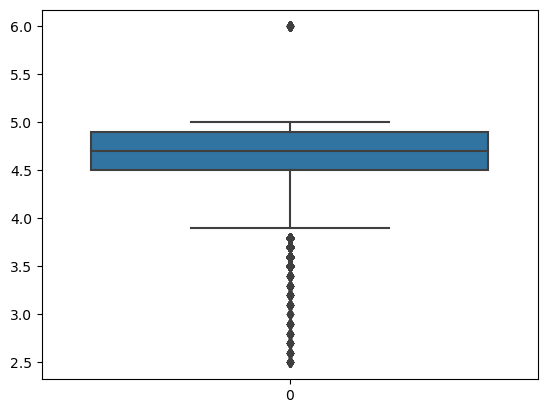

In [66]:
# boxplot

sns.boxplot(df['ratings'])

1. **The Minors data have ratings as 1 which seems like an anomaly if we generally consider the ratings column distribution.**

2. **The rating of 6 is also one another anomaly in the data as maximum ratings are 5 and not more than that**
    - Has to be investigated
    - If data is problematic than fixing or removing is an option

In [67]:
# rows where the star rating is 6

six_star_data = df[df['ratings'] == 6]

len(six_star_data)

53

In [68]:
six_star_data

,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken
3586,0x46d,BANGRES05DEL01,50.0,6.0,-12.970324,-77.645748,13.010324,77.685748,13-03-2022,NaN,12:30:00,NaN,NaN,3,Meal,electric_scooter,0,No,Urban,(min) 25
4714,0x493,HYDRES17DEL01,50.0,6.0,-17.451976,-78.385883,17.561976,78.495883,04-04-2022,NaN,23:20:00,NaN,NaN,3,Snack,bicycle,0,No,Metropolitian,(min) 27
5169,0x4f2,JAPRES08DEL01,50.0,6.0,-26.910262,-75.783013,27.020262,75.893013,18-03-2022,NaN,18:50:00,NaN,NaN,3,Drinks,scooter,1,No,Metropolitian,(min) 20
5362,0x430,BANGRES19DEL01,50.0,6.0,12.914264,77.678400,13.024264,77.788400,06-04-2022,NaN,20:55:00,NaN,NaN,3,Meal,electric_scooter,1,No,Metropolitian,(min) 18
5651,0xbef1,AGRRES13DEL02,50.0,6.0,-27.159795,-78.042990,27.209795,78.092990,13-02-2022,NaN,18:05:00,NaN,NaN,3,Drinks,scooter,1,No,Metropolitian,(min) 20
6394,0x427,JAPRES06DEL02,50.0,6.0,26.911927,75.797282,27.041927,75.927282,02-04-2022,NaN,22:10:00,NaN,NaN,3,Meal,electric_scooter,0,No,Urban,(min) 20
7031,0x3eb,MYSRES15DEL02,50.0,6.0,-12.352058,-76.606650,12.372058,76.626650,15-03-2022,NaN,10:00:00,NaN,NaN,3,Buffet,scooter,1,No,Metropolitian,(min) 14
7681,0xd42,VADRES09DEL01,50.0,6.0,0.000000,0.000000,0.010000,0.010000,21-03-2022,NaN,08:35:00,NaN,NaN,3,Meal,bicycle,1,No,Metropolitian,(min) 22
9499,0x3f0,BANGRES010DEL01,50.0,6.0,12.933298,77.614293,13.003298,77.684293,12-03-2022,NaN,18:25:00,NaN,NaN,3,Drinks,scooter,1,No,Urban,(min) 17
9535,0x3ef,RANCHIRES13DEL01,50.0,6.0,-23.374989,-85.335486,23.444989,85.405486,20-03-2022,NaN,17:55:00,NaN,NaN,3,Snack,bicycle,1,No,Metropolitian,(min) 32


In [69]:
df.shape

(45555, 20)

In [70]:
six_star_index = six_star_data.index.tolist()
six_star_index

[3586,
 4714,
 5169,
 5362,
 5651,
 6394,
 7031,
 7681,
 9499,
 9535,
 10100,
 10737,
 12297,
 13257,
 13652,
 14106,
 14907,
 14944,
 16798,
 17145,
 17708,
 18977,
 19382,
 20269,
 21320,
 22416,
 23375,
 24237,
 24918,
 25285,
 26052,
 27221,
 27399,
 28315,
 28974,
 29535,
 30579,
 30943,
 31233,
 32326,
 33533,
 34688,
 38007,
 38020,
 38561,
 38649,
 39699,
 40223,
 41105,
 41969,
 42072,
 42835,
 45332]

In [71]:
df.drop(index = six_star_index , inplace = True)

In [72]:
df.shape

(45502, 20)

**Investigate further before action**

Data removal seems logical at this stage.

### Location Columns

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45502 entries, 0 to 45592
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    45502 non-null  object 
 1   rider_id              45502 non-null  object 
 2   age                   43648 non-null  float64
 3   ratings               43594 non-null  float64
 4   restaurant_latitude   45502 non-null  float64
 5   restaurant_longitude  45502 non-null  float64
 6   delivery_latitude     45502 non-null  float64
 7   delivery_longitude    45502 non-null  float64
 8   order_date            45502 non-null  object 
 9   order_time            43862 non-null  object 
 10  order_picked_time     45502 non-null  object 
 11  weather               44977 non-null  object 
 12  traffic               44992 non-null  object 
 13  vehicle_condition     45502 non-null  int64  
 14  type_of_order         45502 non-null  object 
 15  type_of_vehicle    

In [74]:
location_columns = df.columns[4:8].tolist()

location_columns

['restaurant_latitude',
 'restaurant_longitude',
 'delivery_latitude',
 'delivery_longitude']

In [75]:
location_subset = df.loc[:,location_columns]
location_subset.head(100)

,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude
0,22.745049,75.892471,22.765049,75.912471
1,12.913041,77.683237,13.043041,77.813237
2,12.914264,77.678400,12.924264,77.688400
3,11.003669,76.976494,11.053669,77.026494
4,12.972793,80.249982,13.012793,80.289982
5,17.431668,78.408321,17.461668,78.438321
6,23.369746,85.339820,23.479746,85.449820
7,12.352058,76.606650,12.482058,76.736650
8,17.433809,78.386744,17.563809,78.516744
9,30.327968,78.046106,30.397968,78.116106


**Valid values for lat and long**

 > India lies to the north of the equator between `6° 44′` and `35° 30′` north latitude and `68° 7′` and `97° 25′` east longitude.

In [76]:
# statistical analysis

location_subset.describe()

,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude
count,45502.000000,45502.000000,45502.000000,45502.000000
mean,17.046293,70.326557,17.468434,70.848718
std,8.131457,22.591753,7.334058,21.111306
min,-30.905562,-88.352885,0.010000,0.010000
25%,12.933284,73.170283,12.988453,73.280000
50%,18.551440,75.898497,18.634382,76.002471
75%,22.728163,78.045043,22.785049,78.105359
max,30.914057,88.433452,31.054057,88.563452


In [77]:
# set the lower bound limits for the lat and long

lower_bound_lat = 6.44
lower_bound_long = 68.70

In [78]:
# rows of data where latitude and longitude values are below the bounds

df[(df['restaurant_latitude'] < lower_bound_lat) | (df['restaurant_longitude'] < lower_bound_long) |
        (df['delivery_latitude'] < lower_bound_lat) | (df['delivery_longitude'] < lower_bound_long)].sample(50)

,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken
37130,0xb91d,RANCHIRES02DEL01,34.0,4.2,0.000000,0.000000,0.070000,0.070000,06-03-2022,20:15:00,20:25:00,Stormy,Jam,0,Meal,motorcycle,2,No,Metropolitian,(min) 45
44756,0x4e04,RANCHIRES02DEL01,33.0,4.3,0.000000,0.000000,0.110000,0.110000,06-04-2022,20:25:00,20:40:00,Cloudy,Jam,2,Meal,scooter,1,No,Metropolitian,(min) 43
40392,0xe0cf,KNPRES06DEL01,37.0,4.1,0.000000,0.000000,0.010000,0.010000,13-02-2022,11:45:00,11:50:00,Cloudy,High,2,Buffet,electric_scooter,1,No,Metropolitian,(min) 33
14579,0xcf56,AURGRES20DEL01,34.0,4.7,0.000000,0.000000,0.110000,0.110000,12-02-2022,21:50:00,22:00:00,Sunny,Jam,0,Drinks,motorcycle,1,No,Metropolitian,(min) 29
24291,0xe02e,AGRRES06DEL02,38.0,5.0,0.000000,0.000000,0.130000,0.130000,14-02-2022,19:45:00,20:00:00,Fog,Jam,2,Drinks,electric_scooter,1,No,Metropolitian,(min) 36
25557,0xcacc,AURGRES16DEL01,22.0,4.8,0.000000,0.000000,0.110000,0.110000,14-02-2022,17:25:00,17:30:00,Stormy,Medium,0,Snack,motorcycle,1,No,Urban,(min) 23
2786,0x66d9,VADRES17DEL03,39.0,4.6,0.000000,0.000000,0.030000,0.030000,03-03-2022,22:25:00,22:35:00,Cloudy,Low,1,Buffet,motorcycle,0,No,Urban,(min) 16
907,0x50db,RANCHIRES12DEL03,39.0,4.3,0.000000,0.000000,0.090000,0.090000,10-03-2022,21:10:00,21:15:00,Windy,Jam,1,Buffet,motorcycle,2,No,Metropolitian,(min) 40
35682,0xc382,DEHRES01DEL01,NaN,NaN,0.000000,0.000000,0.040000,0.040000,17-02-2022,NaN,15:40:00,Stormy,Medium,0,Snack,motorcycle,1,No,Urban,(min) 36
44358,0x7bb1,VADRES09DEL02,36.0,4.8,0.000000,0.000000,0.050000,0.050000,03-04-2022,18:55:00,19:05:00,Cloudy,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 28


In [79]:
# number of rows in data where lat long are erroneous

location_subset[(location_subset['restaurant_latitude'] < lower_bound_lat) |
                    (location_subset['restaurant_longitude'] < lower_bound_long) |
                    (location_subset['delivery_latitude'] < lower_bound_lat) |
                    (location_subset['delivery_longitude'] < lower_bound_long)].shape[0]

4029

**There are 4029 rows in the data where the lat long columns are messy**

In [80]:
# statistical summary of problematic rows where lat long is below the country's geographical limits

location_subset[(location_subset['restaurant_latitude'] < lower_bound_lat) |
                    (location_subset['restaurant_longitude'] < lower_bound_long) |
                    (location_subset['delivery_latitude'] < lower_bound_lat) |
                    (location_subset['delivery_longitude'] < lower_bound_long)].describe()

,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude
count,4029.000000,4029.000000,4029.000000,4029.000000
mean,-2.024551,2.522899,2.087684,7.764720
std,6.385871,24.383056,6.386195,23.271934
min,-30.905562,-88.352885,0.010000,0.010000
25%,0.000000,0.000000,0.040000,0.040000
50%,0.000000,0.000000,0.070000,0.070000
75%,0.000000,0.000000,0.110000,0.110000
max,0.000000,88.433452,31.045562,88.523452


(array([1, 2, 3, 4]),
 [Text(1, 0, 'restaurant_latitude'),
  Text(2, 0, 'restaurant_longitude'),
  Text(3, 0, 'delivery_latitude'),
  Text(4, 0, 'delivery_longitude')])

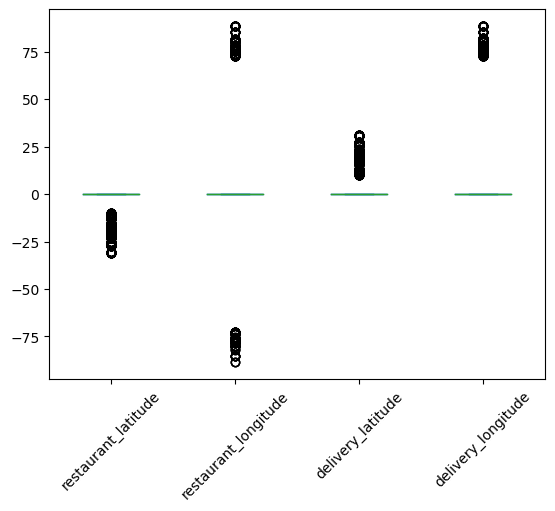

In [81]:
# boxplots for all the anomalies

location_subset.loc[(location_subset['restaurant_latitude'] < lower_bound_lat) |
                    (location_subset['restaurant_longitude'] < lower_bound_long) |
                    (location_subset['delivery_latitude'] < lower_bound_lat) |
                    (location_subset['delivery_longitude'] < lower_bound_long)].plot(kind="box")

plt.xticks(rotation=45)

**Negative Values are correct just we have to take absolute**

**While calculating the distances we can assign null values to these erroneous data points and then impute the values using advanced imputation techniques**

In [82]:
columns_to_abs = ['restaurant_latitude',
                  'restaurant_longitude',
                  'delivery_latitude',
                  'delivery_longitude']

df[columns_to_abs] = df[columns_to_abs].abs()


In [83]:
df[ ['restaurant_latitude','restaurant_longitude','delivery_latitude','delivery_longitude']].describe()

,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude
count,45502.000000,45502.000000,45502.000000,45502.000000
mean,17.404823,70.785107,17.468434,70.848718
std,7.332705,21.111115,7.334058,21.111306
min,0.000000,0.000000,0.010000,0.010000
25%,12.934179,73.170283,12.988453,73.280000
50%,18.554382,75.898497,18.634382,76.002471
75%,22.732225,78.046106,22.785049,78.105359
max,30.914057,88.433452,31.054057,88.563452


In [84]:
df.shape

(45502, 20)

(array([1, 2, 3, 4]),
 [Text(1, 0, 'restaurant_latitude'),
  Text(2, 0, 'restaurant_longitude'),
  Text(3, 0, 'delivery_latitude'),
  Text(4, 0, 'delivery_longitude')])

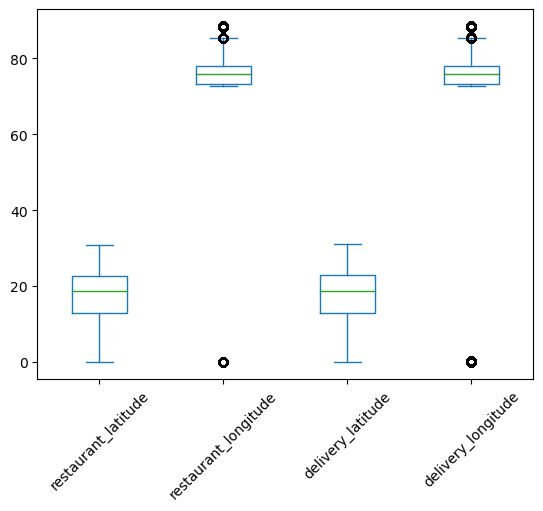

In [85]:
# taking the absolute values

(
    location_subset.abs().plot(kind="box")
)

plt.xticks(rotation=45)

In [86]:
# number of rows after taking absolute values

df[(df['restaurant_latitude'] < lower_bound_lat) | (df['restaurant_longitude'] < lower_bound_long) |
                     (df['delivery_latitude'] < lower_bound_lat) |
                     (df['delivery_longitude'] < lower_bound_long)].sample(5)



,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken
30468,0x1df1,VADRES07DEL02,22.0,4.8,0.0,0.0,0.08,0.08,02-04-2022,19:30:00,19:45:00,Windy,Jam,2,Meal,scooter,1,No,Urban,(min) 15
20431,0x25fc,VADRES07DEL02,30.0,4.2,0.0,0.0,0.13,0.13,27-03-2022,20:35:00,20:45:00,Stormy,Jam,0,Buffet,motorcycle,1,Yes,Metropolitian,(min) 46
1756,0x5278,MYSRES14DEL01,33.0,4.9,0.0,0.0,0.11,0.11,04-03-2022,22:25:00,22:30:00,Stormy,Low,1,Drinks,motorcycle,1,No,Urban,(min) 15
21270,0x7f6e,RANCHIRES03DEL01,32.0,4.6,0.0,0.0,0.04,0.04,28-03-2022,14:35:00,14:45:00,Windy,High,0,Snack,motorcycle,1,No,Metropolitian,(min) 30
34577,0xde5b,AURGRES02DEL03,31.0,4.6,0.0,0.0,0.03,0.03,15-02-2022,17:55:00,18:00:00,Windy,Medium,1,Meal,motorcycle,0,No,Metropolitian,(min) 29


In [87]:
df.loc[df['restaurant_latitude'] < lower_bound_lat, 'restaurant_latitude'].value_counts()

0.0    3630
Name: restaurant_latitude, dtype: int64

Every entry in the restaurant_latitude column is less than the expected lower bound and is consistently recorded as 0.

In [88]:
df.loc[df['restaurant_longitude'] < lower_bound_long, 'restaurant_longitude'].value_counts()

0.0    3630
Name: restaurant_longitude, dtype: int64

All values in the restaurant_longitude column are less than the expected lower bound and are consistently 0.

In [89]:
df.loc[df['delivery_latitude'] < lower_bound_lat, 'delivery_latitude'].value_counts()

0.13    341
0.06    336
0.02    335
0.04    335
0.09    335
0.07    332
0.11    327
0.05    327
0.01    326
0.08    324
0.03    312
Name: delivery_latitude, dtype: int64

All values in the delivery_latitude column fall below the lower expected threshold (< 1), which strongly suggests invalid or corrupted geolocation data.

In [90]:
df.loc[df['delivery_longitude'] < lower_bound_long, 'delivery_longitude'].value_counts()

0.13    341
0.06    336
0.02    335
0.04    335
0.09    335
0.07    332
0.11    327
0.05    327
0.01    326
0.08    324
0.03    312
Name: delivery_longitude, dtype: int64

All values in the delivery_longitude column fall below the lower expected threshold (< 1), which strongly suggests invalid or corrupted geolocation data.

In [91]:
df[(df['restaurant_latitude'] < lower_bound_lat) | (df['restaurant_longitude'] < lower_bound_long) |
                     (df['delivery_latitude'] < lower_bound_lat) |
                     (df['delivery_longitude'] < lower_bound_long)].shape

(3630, 20)

**`3630` rows in the data that have messy lat long values**

**All the messy lat long values are less than 1**

In [92]:
df.isnull().sum()

id                         0
rider_id                   0
age                     1854
ratings                 1908
restaurant_latitude        0
restaurant_longitude       0
delivery_latitude          0
delivery_longitude         0
order_date                 0
order_time              1640
order_picked_time          0
weather                  525
traffic                  510
vehicle_condition          0
type_of_order              0
type_of_vehicle            0
multiple_deliveries      993
festival                 228
city_type               1198
time_taken                 0
dtype: int64

In [93]:
def clean_lat_long(data, threshold=1):
    # Get the list of location columns (like latitudes and longitudes)
    location_columns = location_subset.columns.tolist()
    
    # For each location column, set values < threshold to NaN
    for col in location_columns:
        data[col] = data[col].apply(lambda x: np.nan if x < threshold else x)
    
    return data


In [94]:
clean_lat_long(df).head()

,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken
0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


In [95]:
df.isnull().sum()

id                         0
rider_id                   0
age                     1854
ratings                 1908
restaurant_latitude     3630
restaurant_longitude    3630
delivery_latitude       3630
delivery_longitude      3630
order_date                 0
order_time              1640
order_picked_time          0
weather                  525
traffic                  510
vehicle_condition          0
type_of_order              0
type_of_vehicle            0
multiple_deliveries      993
festival                 228
city_type               1198
time_taken                 0
dtype: int64

### Order Date

In [96]:
df['order_date'].dtype

dtype('O')

In [97]:
# check for missing values

df['order_date'].isna().sum()

0

In [98]:
# unique values in order date

df['order_date'].unique()

array(['19-03-2022', '25-03-2022', '05-04-2022', '26-03-2022',
       '11-03-2022', '04-03-2022', '14-03-2022', '20-03-2022',
       '12-02-2022', '13-02-2022', '14-02-2022', '02-04-2022',
       '01-03-2022', '16-03-2022', '15-02-2022', '10-03-2022',
       '27-03-2022', '12-03-2022', '01-04-2022', '05-03-2022',
       '11-02-2022', '08-03-2022', '03-04-2022', '30-03-2022',
       '28-03-2022', '18-03-2022', '06-04-2022', '04-04-2022',
       '24-03-2022', '09-03-2022', '02-03-2022', '13-03-2022',
       '29-03-2022', '31-03-2022', '17-03-2022', '07-03-2022',
       '15-03-2022', '16-02-2022', '03-03-2022', '18-02-2022',
       '23-03-2022', '17-02-2022', '06-03-2022', '21-03-2022'],
      dtype=object)

In [99]:
df['order_date'] = pd.to_datetime(df['order_date'], dayfirst=True)


In [100]:
df['order_date'].unique()

array(['2022-03-19T00:00:00.000000000', '2022-03-25T00:00:00.000000000',
       '2022-04-05T00:00:00.000000000', '2022-03-26T00:00:00.000000000',
       '2022-03-11T00:00:00.000000000', '2022-03-04T00:00:00.000000000',
       '2022-03-14T00:00:00.000000000', '2022-03-20T00:00:00.000000000',
       '2022-02-12T00:00:00.000000000', '2022-02-13T00:00:00.000000000',
       '2022-02-14T00:00:00.000000000', '2022-04-02T00:00:00.000000000',
       '2022-03-01T00:00:00.000000000', '2022-03-16T00:00:00.000000000',
       '2022-02-15T00:00:00.000000000', '2022-03-10T00:00:00.000000000',
       '2022-03-27T00:00:00.000000000', '2022-03-12T00:00:00.000000000',
       '2022-04-01T00:00:00.000000000', '2022-03-05T00:00:00.000000000',
       '2022-02-11T00:00:00.000000000', '2022-03-08T00:00:00.000000000',
       '2022-04-03T00:00:00.000000000', '2022-03-30T00:00:00.000000000',
       '2022-03-28T00:00:00.000000000', '2022-03-18T00:00:00.000000000',
       '2022-04-06T00:00:00.000000000', '2022-04-04

In [101]:
df.head()

,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken
0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


In [102]:
# date range

order_date = df['order_date']

order_date.max() - order_date.min()

Timedelta('54 days 00:00:00')

In [103]:
order_date.agg(["min","max"])

min   2022-02-11
max   2022-04-06
Name: order_date, dtype: datetime64[ns]

In [104]:
def extract_datetime_features(series):
    # Create a new DataFrame with extracted date features
    dates = series
    features = pd.DataFrame()
    features['day'] = dates.dt.day
    features['month'] = dates.dt.month
    features['year'] = dates.dt.year
    features['day_of_week'] = dates.dt.day_name()
    features['is_weekend'] = features['day_of_week'].isin(['Saturday', 'Sunday']).astype(int)
    
    return features


In [105]:
date_features = extract_datetime_features(df['order_date'])

In [106]:
df = pd.concat([df , date_features] , axis = 1)

In [107]:
df.head(20)

,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken,day,month,year,day_of_week,is_weekend
0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24,19,3,2022,Saturday,1
1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33,25,3,2022,Friday,0
2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26,19,3,2022,Saturday,1
3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21,5,4,2022,Tuesday,0
4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30,26,3,2022,Saturday,1
5,0x9bb4,HYDRES09DEL03,22.0,4.8,17.431668,78.408321,17.461668,78.438321,2022-03-11,21:20:00,21:30:00,Cloudy,Jam,0,Buffet,motorcycle,1,No,Urban,(min) 26,11,3,2022,Friday,0
6,0x95b4,RANCHIRES15DEL01,33.0,4.7,23.369746,85.339820,23.479746,85.449820,2022-03-04,19:15:00,19:30:00,Fog,Jam,1,Meal,scooter,1,No,Metropolitian,(min) 40,4,3,2022,Friday,0
7,0x9eb2,MYSRES15DEL02,35.0,4.6,12.352058,76.606650,12.482058,76.736650,2022-03-14,17:25:00,17:30:00,Cloudy,Medium,2,Meal,motorcycle,1,No,Metropolitian,(min) 32,14,3,2022,Monday,0
8,0x1102,HYDRES05DEL02,22.0,4.8,17.433809,78.386744,17.563809,78.516744,2022-03-20,20:55:00,21:05:00,Stormy,Jam,0,Buffet,motorcycle,1,No,Metropolitian,(min) 34,20,3,2022,Sunday,1
9,0xcdcd,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,2022-02-12,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3,No,Metropolitian,(min) 46,12,2,2022,Saturday,1


In [108]:
df.shape

(45502, 25)

### Order time and Order picked time

In [109]:
df['order_time'].unique()

array(['11:30:00', '19:45:00', '08:30:00', '18:00:00', '13:30:00',
       '21:20:00', '19:15:00', '17:25:00', '20:55:00', '21:55:00',
       '14:55:00', '17:30:00', '09:20:00', '19:50:00', '20:25:00',
       '20:30:00', '20:40:00', '21:15:00', '20:20:00', '22:30:00',
       '08:15:00', '19:30:00', '12:25:00', '18:35:00', '20:35:00',
       '23:20:00', '23:35:00', '22:35:00', '23:25:00', '13:35:00',
       '21:35:00', '18:55:00', '14:15:00', '11:00:00', '09:45:00',
       '08:40:00', '23:00:00', nan, '19:10:00', '10:55:00', '21:40:00',
       '19:00:00', '16:45:00', '15:10:00', '22:45:00', '22:10:00',
       '20:45:00', '22:50:00', '17:55:00', '09:25:00', '20:15:00',
       '22:25:00', '22:40:00', '23:50:00', '15:25:00', '10:20:00',
       '10:40:00', '15:55:00', '20:10:00', '12:10:00', '15:30:00',
       '10:35:00', '21:10:00', '20:50:00', '12:35:00', '21:00:00',
       '23:40:00', '18:15:00', '18:20:00', '11:45:00', '12:45:00',
       '23:30:00', '10:50:00', '21:25:00', '10:10:00', '1

In [110]:
df[df['order_time'].isnull()]

,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken,day,month,year,day_of_week,is_weekend
42,0x4f0,MUMRES17DEL02,NaN,NaN,19.121999,72.908493,19.201999,72.988493,2022-04-06,NaN,18:35:00,Cloudy,Medium,1,Drinks,scooter,1,No,Metropolitian,(min) 33,6,4,2022,Wednesday,0
74,0xa9f,BANGRES13DEL01,NaN,NaN,12.935662,77.614130,12.975662,77.654130,2022-03-11,NaN,15:30:00,NaN,NaN,1,Drinks,scooter,0,No,Metropolitian,(min) 19,11,3,2022,Friday,0
120,0x6e2,VADRES06DEL01,NaN,NaN,22.312790,73.170283,22.422790,73.280283,2022-04-02,NaN,18:25:00,NaN,NaN,3,Snack,electric_scooter,0,No,Metropolitian,(min) 25,2,4,2022,Saturday,1
140,0x1ec7,PUNERES05DEL03,NaN,NaN,18.543626,73.905101,18.573626,73.935101,2022-03-09,NaN,23:40:00,Stormy,Low,2,Snack,scooter,0,No,NaN,(min) 19,9,3,2022,Wednesday,0
179,0x1b58,JAPRES03DEL01,NaN,NaN,26.913483,75.803139,26.983483,75.873139,2022-03-12,NaN,17:50:00,Sandstorms,Medium,0,Drinks,motorcycle,0,No,Metropolitian,(min) 43,12,3,2022,Saturday,1
231,0x1b5b,RANCHIRES14DEL01,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-02,NaN,20:50:00,Sandstorms,Jam,1,Snack,scooter,0,No,Metropolitian,(min) 24,2,3,2022,Wednesday,0
250,0x1b50,PUNERES16DEL01,NaN,NaN,18.536718,73.830327,18.646718,73.940327,2022-03-08,NaN,21:25:00,NaN,NaN,3,Buffet,motorcycle,1,Yes,Urban,(min) 43,8,3,2022,Tuesday,0
289,0x4db,PUNERES02DEL03,NaN,NaN,18.551440,73.804855,18.611440,73.864855,2022-03-05,NaN,22:05:00,Stormy,Jam,2,Meal,scooter,0,No,Urban,(min) 12,5,3,2022,Saturday,1
305,0x6a7,RANCHIRES08DEL01,NaN,NaN,23.353783,85.326967,23.463783,85.436967,2022-04-04,NaN,19:45:00,Fog,Jam,2,Drinks,scooter,1,No,Metropolitian,(min) 39,4,4,2022,Monday,0
331,0x73c,VADRES12DEL03,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-05,NaN,22:40:00,Fog,Low,0,Meal,motorcycle,1,No,Metropolitian,(min) 26,5,3,2022,Saturday,1


In [111]:
df.isnull().sum()

id                         0
rider_id                   0
age                     1854
ratings                 1908
restaurant_latitude     3630
restaurant_longitude    3630
delivery_latitude       3630
delivery_longitude      3630
order_date                 0
order_time              1640
order_picked_time          0
weather                  525
traffic                  510
vehicle_condition          0
type_of_order              0
type_of_vehicle            0
multiple_deliveries      993
festival                 228
city_type               1198
time_taken                 0
day                        0
month                      0
year                       0
day_of_week                0
is_weekend                 0
dtype: int64

In [112]:
time_subset = df.loc[:,["order_time","order_picked_time"]]
time_subset.head(100)

,order_time,order_picked_time
0,11:30:00,11:45:00
1,19:45:00,19:50:00
2,08:30:00,08:45:00
3,18:00:00,18:10:00
4,13:30:00,13:45:00
5,21:20:00,21:30:00
6,19:15:00,19:30:00
7,17:25:00,17:30:00
8,20:55:00,21:05:00
9,21:55:00,22:10:00


In [113]:
time_subset.head()

,order_time,order_picked_time
0,11:30:00,11:45:00
1,19:45:00,19:50:00
2,08:30:00,08:45:00
3,18:00:00,18:10:00
4,13:30:00,13:45:00


In [114]:
time_subset['order_time'].unique()

array(['11:30:00', '19:45:00', '08:30:00', '18:00:00', '13:30:00',
       '21:20:00', '19:15:00', '17:25:00', '20:55:00', '21:55:00',
       '14:55:00', '17:30:00', '09:20:00', '19:50:00', '20:25:00',
       '20:30:00', '20:40:00', '21:15:00', '20:20:00', '22:30:00',
       '08:15:00', '19:30:00', '12:25:00', '18:35:00', '20:35:00',
       '23:20:00', '23:35:00', '22:35:00', '23:25:00', '13:35:00',
       '21:35:00', '18:55:00', '14:15:00', '11:00:00', '09:45:00',
       '08:40:00', '23:00:00', nan, '19:10:00', '10:55:00', '21:40:00',
       '19:00:00', '16:45:00', '15:10:00', '22:45:00', '22:10:00',
       '20:45:00', '22:50:00', '17:55:00', '09:25:00', '20:15:00',
       '22:25:00', '22:40:00', '23:50:00', '15:25:00', '10:20:00',
       '10:40:00', '15:55:00', '20:10:00', '12:10:00', '15:30:00',
       '10:35:00', '21:10:00', '20:50:00', '12:35:00', '21:00:00',
       '23:40:00', '18:15:00', '18:20:00', '11:45:00', '12:45:00',
       '23:30:00', '10:50:00', '21:25:00', '10:10:00', '1

In [115]:
time_subset[time_subset['order_time'].isnull()].head() 

,order_time,order_picked_time
42,NaN,18:35:00
74,NaN,15:30:00
120,NaN,18:25:00
140,NaN,23:40:00
179,NaN,17:50:00


In [116]:
time_subset.iloc[42 , 0]

nan

In [117]:
#time_subset['order_time'] = time_subset['order_time'].replace(NaT, np.NaN)
#time_subset['order_picked_time'] = time_subset['order_picked_time'].replace(NaT, np.NaN)

In [118]:
time_subset['order_time'] = pd.to_datetime(time_subset['order_time'], format="%H:%M:%S", errors='coerce')
time_subset['order_picked_time'] = pd.to_datetime(time_subset['order_picked_time'], format="%H:%M:%S", errors='coerce')



In [119]:
time_subset['order_time'].head(10)

0   1900-01-01 11:30:00
1   1900-01-01 19:45:00
2   1900-01-01 08:30:00
3   1900-01-01 18:00:00
4   1900-01-01 13:30:00
5   1900-01-01 21:20:00
6   1900-01-01 19:15:00
7   1900-01-01 17:25:00
8   1900-01-01 20:55:00
9   1900-01-01 21:55:00
Name: order_time, dtype: datetime64[ns]

In [120]:
time_subset['order_picked_time'].head(10)

0   1900-01-01 11:45:00
1   1900-01-01 19:50:00
2   1900-01-01 08:45:00
3   1900-01-01 18:10:00
4   1900-01-01 13:45:00
5   1900-01-01 21:30:00
6   1900-01-01 19:30:00
7   1900-01-01 17:30:00
8   1900-01-01 21:05:00
9   1900-01-01 22:10:00
Name: order_picked_time, dtype: datetime64[ns]

In [123]:
# Fix time where picked time is earlier than order time (e.g., past midnight)
#mask = time_subset['order_picked_time'] < time_subset['order_time']
time_subset.loc[time_subset['order_picked_time'] < time_subset['order_time'], 'order_picked_time'] += pd.Timedelta(days=1)

# Calculate pickup time in minutes
time_subset['pickup_time'] = (
    time_subset['order_picked_time'] - time_subset['order_time']
).dt.total_seconds() / 60

# Extract hour from order time
time_subset['order_time_hour'] = time_subset['order_time'].dt.hour

# Define time of day category
def time_of_day(hour):
    if 6 <= hour < 12:
        return "morning"
    elif 12 <= hour < 17:
        return "afternoon"
    elif 17 <= hour < 19:
        return "evening"
    elif 19 <= hour < 23:
        return "night"
    elif (hour >= 23) or (hour < 6):
        return "late_night"
    else:
        return np.nan

# Apply time of day categorization
time_subset['order_time_of_day'] = time_subset['order_time_hour'].apply(time_of_day)




In [124]:
time_subset.head(100)

,order_time,order_picked_time,pickup_time,order_time_hour,order_time_of_day
0,1900-01-01 11:30:00,1900-01-01 11:45:00,15.0,11.0,morning
1,1900-01-01 19:45:00,1900-01-01 19:50:00,5.0,19.0,night
2,1900-01-01 08:30:00,1900-01-01 08:45:00,15.0,8.0,morning
3,1900-01-01 18:00:00,1900-01-01 18:10:00,10.0,18.0,evening
4,1900-01-01 13:30:00,1900-01-01 13:45:00,15.0,13.0,afternoon
5,1900-01-01 21:20:00,1900-01-01 21:30:00,10.0,21.0,night
6,1900-01-01 19:15:00,1900-01-01 19:30:00,15.0,19.0,night
7,1900-01-01 17:25:00,1900-01-01 17:30:00,5.0,17.0,evening
8,1900-01-01 20:55:00,1900-01-01 21:05:00,10.0,20.0,night
9,1900-01-01 21:55:00,1900-01-01 22:10:00,15.0,21.0,night


In [125]:
time_subset['pickup_time'].value_counts()

5.0     14703
15.0    14610
10.0    14549
Name: pickup_time, dtype: int64

In [126]:
time_subset['order_time'] = time_subset['order_time'].dt.time
time_subset['order_picked_time'] = time_subset['order_picked_time'].dt.time

In [127]:
time_subset.head()

,order_time,order_picked_time,pickup_time,order_time_hour,order_time_of_day
0,11:30:00,11:45:00,15.0,11.0,morning
1,19:45:00,19:50:00,5.0,19.0,night
2,08:30:00,08:45:00,15.0,8.0,morning
3,18:00:00,18:10:00,10.0,18.0,evening
4,13:30:00,13:45:00,15.0,13.0,afternoon


In [128]:
time_subset.shape

(45502, 5)

In [129]:
time_subset.drop(columns = ['order_time' , 'order_picked_time'] , axis = 1 , inplace=True)

In [130]:
time_subset.shape

(45502, 3)

In [131]:
df = pd.concat([df , time_subset] , axis = 1)

In [132]:
df.head()

,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken,day,month,year,day_of_week,is_weekend,pickup_time,order_time_hour,order_time_of_day
0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24,19,3,2022,Saturday,1,15.0,11.0,morning
1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33,25,3,2022,Friday,0,5.0,19.0,night
2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26,19,3,2022,Saturday,1,15.0,8.0,morning
3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21,5,4,2022,Tuesday,0,10.0,18.0,evening
4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30,26,3,2022,Saturday,1,15.0,13.0,afternoon


In [133]:
df.shape

(45502, 28)

### Weather

In [134]:
# value counts

df['weather'].value_counts()

Fog           7654
Stormy        7586
Cloudy        7536
Sandstorms    7495
Windy         7422
Sunny         7284
Name: weather, dtype: int64

In [135]:
df['weather'].dtype

dtype('O')

In [136]:
# unique values
df['weather'].unique()

array(['Sunny', 'Stormy', 'Sandstorms', 'Cloudy', 'Fog', 'Windy', nan],
      dtype=object)

### Traffic

In [137]:
# value counts

df['traffic'].value_counts()

Low        15477
Jam        14143
Medium     10947
High        4425
Name: traffic, dtype: int64

In [138]:
df['traffic'].dtype

dtype('O')

In [139]:
# unique values
df['traffic'].unique()

array(['High ', 'Jam ', 'Low ', 'Medium ', nan], dtype=object)

### Vehicle Condition

In [140]:
# unique values in column

np.sort(df['vehicle_condition'].unique())

array([0, 1, 2, 3], dtype=int64)

In [141]:
df['vehicle_condition'].dtype

dtype('int64')

### Type of order

In [142]:
# value counts

df['type_of_order'].value_counts()

Snack      11512
Meal       11435
Drinks     11294
Buffet     11261
Name: type_of_order, dtype: int64

In [143]:
df['type_of_order'].dtype

dtype('O')

In [144]:
# unique values
df['type_of_order'].unique()

array(['Snack ', 'Drinks ', 'Buffet ', 'Meal '], dtype=object)

In [145]:
df['type_of_order'].str.strip().str.lower().unique()


array(['snack', 'drinks', 'buffet', 'meal'], dtype=object)

### Type of vehicle

In [146]:
# value counts

df['type_of_vehicle'].value_counts()

motorcycle           26427
scooter              15244
electric_scooter      3778
bicycle                 53
Name: type_of_vehicle, dtype: int64

In [147]:
df['type_of_vehicle'].dtype

dtype('O')

In [148]:
# unique values
df['type_of_vehicle'].unique()

array(['motorcycle ', 'scooter ', 'electric_scooter ', 'bicycle '],
      dtype=object)

In [149]:
df['type_of_vehicle'].str.strip().str.lower().unique()

array(['motorcycle', 'scooter', 'electric_scooter', 'bicycle'],
      dtype=object)

### Multiple Deliveries

In [150]:
# datatype of multiple deliveries column

df['multiple_deliveries'].dtype

dtype('O')

In [151]:
# unique values in column

df['multiple_deliveries'].unique()

array(['0', '1', '3', nan, '2'], dtype=object)

In [152]:
df['multiple_deliveries'] = df['multiple_deliveries'].astype(float)

In [153]:
df['multiple_deliveries'].unique()

array([ 0.,  1.,  3., nan,  2.])

### Festival

In [154]:
# unique values in column

df['festival'].unique()

array(['No ', 'Yes ', nan], dtype=object)

In [155]:
df['festival'].str.strip().str.lower().unique()


array(['no', 'yes', nan], dtype=object)

### City type

In [156]:
# unique values in city type

df['city_type'].unique()

array(['Urban ', 'Metropolitian ', 'Semi-Urban ', nan], dtype=object)

In [157]:
df['city_type'].str.rstrip().str.lower().unique()


array(['urban', 'metropolitian', 'semi-urban', nan], dtype=object)

### Time Taken

In [158]:
# datatype of time taken

df['time_taken'].dtype

dtype('O')

In [159]:
df['time_taken'].unique

<bound method Series.unique of 0        (min) 24
1        (min) 33
2        (min) 26
3        (min) 21
4        (min) 30
5        (min) 26
6        (min) 40
7        (min) 32
8        (min) 34
9        (min) 46
10       (min) 23
11       (min) 21
12       (min) 20
13       (min) 41
14       (min) 20
15       (min) 33
16       (min) 40
17       (min) 41
18       (min) 15
19       (min) 36
20       (min) 26
21       (min) 20
22       (min) 39
23       (min) 34
24       (min) 15
25       (min) 18
26       (min) 38
27       (min) 47
28       (min) 12
29       (min) 26
30       (min) 22
31       (min) 21
32       (min) 25
33       (min) 35
34       (min) 30
35       (min) 22
36       (min) 10
37       (min) 19
38       (min) 11
39       (min) 11
40       (min) 28
41       (min) 33
42       (min) 33
43       (min) 52
44       (min) 22
45       (min) 16
46       (min) 11
47       (min) 25
48       (min) 26
49       (min) 18
50       (min) 16
51       (min) 23
52       (min) 15
53       (min) 

In [160]:
df['time_taken'] = df['time_taken'].str.replace(r"\(min\)", "", regex=True).str.strip().astype(int)


In [161]:
df['time_taken'].dtype

dtype('int32')

## Perform Cleaning and Feature Building

In [162]:
df.columns

Index(['id', 'rider_id', 'age', 'ratings', 'restaurant_latitude',
       'restaurant_longitude', 'delivery_latitude', 'delivery_longitude',
       'order_date', 'order_time', 'order_picked_time', 'weather', 'traffic',
       'vehicle_condition', 'type_of_order', 'type_of_vehicle',
       'multiple_deliveries', 'festival', 'city_type', 'time_taken', 'day',
       'month', 'year', 'day_of_week', 'is_weekend', 'pickup_time',
       'order_time_hour', 'order_time_of_day'],
      dtype='object')

In [163]:
df.head()

,id,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken,day,month,year,day_of_week,is_weekend,pickup_time,order_time_hour,order_time_of_day
0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0.0,No,Urban,24,19,3,2022,Saturday,1,15.0,11.0,morning
1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1.0,No,Metropolitian,33,25,3,2022,Friday,0,5.0,19.0,night
2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1.0,No,Urban,26,19,3,2022,Saturday,1,15.0,8.0,morning
3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1.0,No,Metropolitian,21,5,4,2022,Tuesday,0,10.0,18.0,evening
4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1.0,No,Metropolitian,30,26,3,2022,Saturday,1,15.0,13.0,afternoon


In [164]:
df.shape

(45502, 28)

In [165]:
df.drop(columns=['id'], axis=1, inplace=True)


In [166]:
df.head()

,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken,day,month,year,day_of_week,is_weekend,pickup_time,order_time_hour,order_time_of_day
0,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0.0,No,Urban,24,19,3,2022,Saturday,1,15.0,11.0,morning
1,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1.0,No,Metropolitian,33,25,3,2022,Friday,0,5.0,19.0,night
2,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1.0,No,Urban,26,19,3,2022,Saturday,1,15.0,8.0,morning
3,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1.0,No,Metropolitian,21,5,4,2022,Tuesday,0,10.0,18.0,evening
4,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1.0,No,Metropolitian,30,26,3,2022,Saturday,1,15.0,13.0,afternoon


In [167]:
df['city_name'] = df['rider_id'].str.split('RES').str[0]

In [168]:
df['city_name']

0          INDO
1          BANG
2          BANG
3         COIMB
4          CHEN
5           HYD
6        RANCHI
7           MYS
8           HYD
9           DEH
10          KOC
11         PUNE
12         LUDH
13          KNP
14          MUM
15          MYS
16         PUNE
17          HYD
18          KOL
19         PUNE
20       RANCHI
21        COIMB
22         CHEN
23          MUM
24         CHEN
25          JAP
26          SUR
27         BANG
28         PUNE
29        COIMB
30          SUR
31          GOA
32          GOA
33       RANCHI
34         PUNE
35         PUNE
36         PUNE
37          SUR
38          HYD
39         BANG
40         BANG
41         CHEN
42          MUM
43          SUR
44          MUM
45          KOL
46          MUM
47         BANG
48         CHEN
49          SUR
50       RANCHI
51         BANG
52         AURG
53        COIMB
54          SUR
55        COIMB
56          AGR
57          VAD
58          JAP
59          VAD
60          JAP
61          MYS
62      

In [169]:
df.shape

(45502, 28)

In [170]:
df.head()

,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken,day,month,year,day_of_week,is_weekend,pickup_time,order_time_hour,order_time_of_day,city_name
0,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0.0,No,Urban,24,19,3,2022,Saturday,1,15.0,11.0,morning,INDO
1,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1.0,No,Metropolitian,33,25,3,2022,Friday,0,5.0,19.0,night,BANG
2,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1.0,No,Urban,26,19,3,2022,Saturday,1,15.0,8.0,morning,BANG
3,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1.0,No,Metropolitian,21,5,4,2022,Tuesday,0,10.0,18.0,evening,COIMB
4,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1.0,No,Metropolitian,30,26,3,2022,Saturday,1,15.0,13.0,afternoon,CHEN


In [171]:
location_subset.columns.tolist()

['restaurant_latitude',
 'restaurant_longitude',
 'delivery_latitude',
 'delivery_longitude']

In [172]:
def calculate_haversine_distance(df):
    location_columns = location_subset.columns.tolist()
    lat1 = df[location_columns[0]]
    lon1 = df[location_columns[1]]
    lat2 = df[location_columns[2]]
    lon2 = df[location_columns[3]]

    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(
        dlat / 2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    distance = 6371 * c

    return (
        df.assign(
            distance = distance)
    )

In [173]:
df = calculate_haversine_distance(df)

In [174]:
df.shape

(45502, 29)

## Validate Data Cleaning

In [175]:
# age column

df['age'].agg(["min","max"])

min    20.0
max    39.0
Name: age, dtype: float64

In [176]:
# ratings column

df['ratings'].agg(["min","max"])

min    2.5
max    5.0
Name: ratings, dtype: float64

,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude
count,41872.000000,41872.000000,41872.000000,41872.000000
mean,18.913696,76.921664,18.977356,76.985325
std,5.467265,3.503107,5.469056,3.503260
min,9.957144,72.768726,9.967144,72.778726
25%,12.986047,73.897902,13.065996,73.940327
50%,19.065838,76.618203,19.124049,76.662620
75%,22.751234,78.368855,22.820040,78.405467
max,30.914057,88.433452,31.054057,88.563452


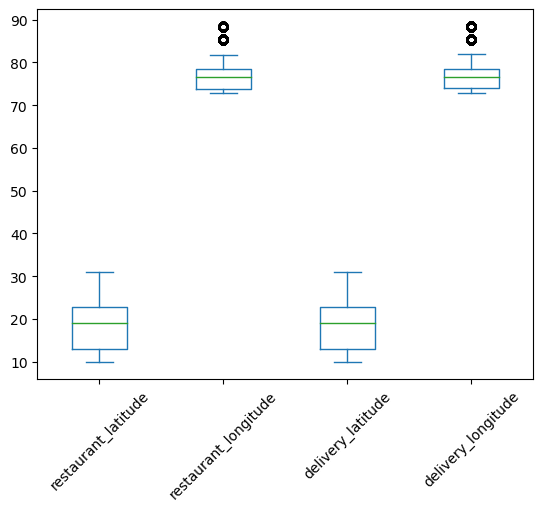

In [177]:
# location columns

df[location_columns].plot(kind="box")

plt.xticks(rotation=45)

display(df[location_columns].describe())

<Axes: >

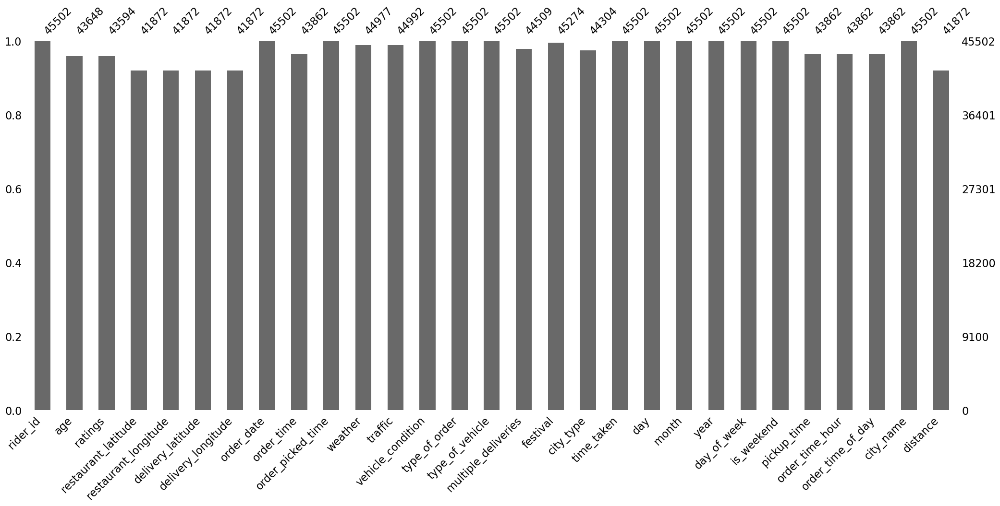

In [178]:
# bar plot of missing values

msno.bar(df)

<Axes: >

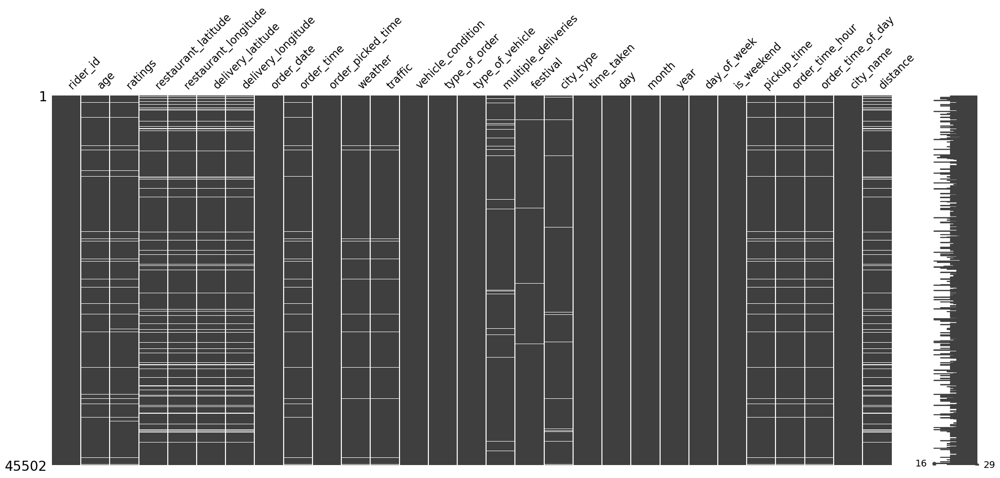

In [179]:
# matrix of missing values

msno.matrix(df)

<Axes: >

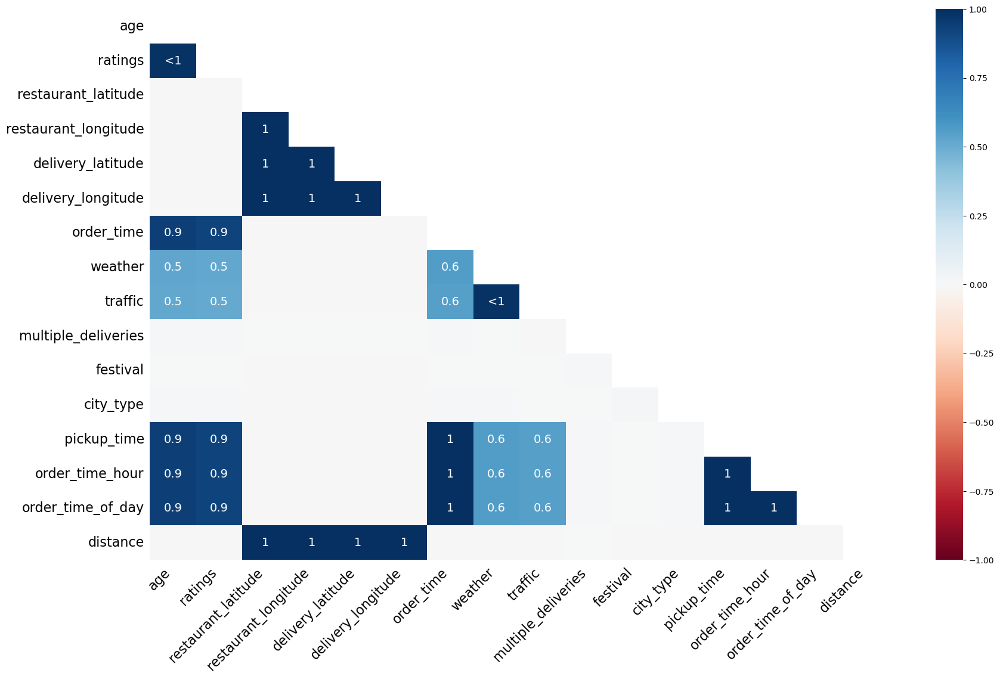

In [180]:
# correlation chart of missing values
msno.heatmap(df)

# Save Cleaned Data

In [181]:
#df.drop(columns = ['order_time.1' , 'order_picked_time.1'] , axis = 1 , inplace = True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45502 entries, 0 to 45592
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   rider_id              45502 non-null  object        
 1   age                   43648 non-null  float64       
 2   ratings               43594 non-null  float64       
 3   restaurant_latitude   41872 non-null  float64       
 4   restaurant_longitude  41872 non-null  float64       
 5   delivery_latitude     41872 non-null  float64       
 6   delivery_longitude    41872 non-null  float64       
 7   order_date            45502 non-null  datetime64[ns]
 8   order_time            43862 non-null  object        
 9   order_picked_time     45502 non-null  object        
 10  weather               44977 non-null  object        
 11  traffic               44992 non-null  object        
 12  vehicle_condition     45502 non-null  int64         
 13  type_of_order   

In [182]:
df.shape

(45502, 29)

In [183]:
# save the cleaned data

df.to_csv("cleaned_data.csv",index=False)

In [184]:
# load the cleaned data

cleaned_data_load = pd.read_csv("cleaned_data.csv")

In [185]:
# data types of cleaned data

cleaned_data_load.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45502 entries, 0 to 45501
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   rider_id              45502 non-null  object 
 1   age                   43648 non-null  float64
 2   ratings               43594 non-null  float64
 3   restaurant_latitude   41872 non-null  float64
 4   restaurant_longitude  41872 non-null  float64
 5   delivery_latitude     41872 non-null  float64
 6   delivery_longitude    41872 non-null  float64
 7   order_date            45502 non-null  object 
 8   order_time            43862 non-null  object 
 9   order_picked_time     45502 non-null  object 
 10  weather               44977 non-null  object 
 11  traffic               44992 non-null  object 
 12  vehicle_condition     45502 non-null  int64  
 13  type_of_order         45502 non-null  object 
 14  type_of_vehicle       45502 non-null  object 
 15  multiple_deliveries

In [186]:
cleaned_data_load.head()

,rider_id,age,ratings,restaurant_latitude,restaurant_longitude,delivery_latitude,delivery_longitude,order_date,order_time,order_picked_time,weather,traffic,vehicle_condition,type_of_order,type_of_vehicle,multiple_deliveries,festival,city_type,time_taken,day,month,year,day_of_week,is_weekend,pickup_time,order_time_hour,order_time_of_day,city_name,distance
0,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,2,Snack,motorcycle,0.0,No,Urban,24,19,3,2022,Saturday,1,15.0,11.0,morning,INDO,3.025149
1,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,2,Snack,scooter,1.0,No,Metropolitian,33,25,3,2022,Friday,0,5.0,19.0,night,BANG,20.183530
2,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,0,Drinks,motorcycle,1.0,No,Urban,26,19,3,2022,Saturday,1,15.0,8.0,morning,BANG,1.552758
3,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,0,Buffet,motorcycle,1.0,No,Metropolitian,21,5,4,2022,Tuesday,0,10.0,18.0,evening,COIMB,7.790401
4,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,1,Snack,scooter,1.0,No,Metropolitian,30,26,3,2022,Saturday,1,15.0,13.0,afternoon,CHEN,6.210138


In [187]:
cleaned_data_load.shape

(45502, 29)